## 실험 내용
- balanced dataset 생성
- unbalanced dataset 생성
- balanced dataset으로 모델 학습
- balanced dataset으로 모델 평가
- unbalanced dataset으로 모델 평가

## dataset 생성 과정
<strong>balanced dataset</strong>
<ol>
    <li>데이터셋 불러오기
    <li>female 데이터셋, male 데이터셋 각각 생성
    <li>female과 male을 비교 분석, 라벨 개수와 데이터 개수 동일하게 맞추기
    <li>X, y 분할
    <li>train 데이터셋과 test 데이터셋으로 분할
</ol>
<strong>unbalanced dataset</strong>
<ul>
    <li>데이터셋 불러오기
    <li>X, y 분할
    <li>train 데이터셋과 test 데이터셋으로 분할
    <li>balanced dataset으로 학습시킨 모델을 평가하기 위해, 모델을 학습시킬 때 사용한 feature을 뺀 나머지 feature 제거.
</ul>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv("../../../dataset/pamap_features.csv", index_col=0)

df

,timestamp,activityID,heartrate,handTemperature,handAcc16_1,handAcc16_2,handAcc16_3,handAcc6_1,handAcc6_2,handAcc6_3,...,ankleGyro2,ankleGyro3,ankleMagne1,ankleMagne2,ankleMagne3,ankleOrientation1,ankleOrientation2,ankleOrientation3,ankleOrientation4,subject_id
0,8.38,0,100.0,30.0000,2.37223,8.60074,3.51048,2.43954,8.76165,3.35465,...,0.009250,-0.017580,-61.1888,-38.95990,-58.143800,1.000000,0.000000,0.000000,0.000000,1
1,8.39,0,100.0,30.0000,2.18837,8.56560,3.66179,2.39494,8.55081,3.64207,...,-0.004638,0.000368,-59.8479,-38.89190,-58.525300,1.000000,0.000000,0.000000,0.000000,1
2,8.40,0,100.0,30.0000,2.37357,8.60107,3.54898,2.30514,8.53644,3.73280,...,0.000148,0.022495,-60.7361,-39.41380,-58.399900,1.000000,0.000000,0.000000,0.000000,1
3,8.41,0,100.0,30.0000,2.07473,8.52853,3.66021,2.33528,8.53622,3.73277,...,-0.020301,0.011275,-60.4091,-38.76350,-58.395600,1.000000,0.000000,0.000000,0.000000,1
4,8.42,0,NaN,30.0000,2.22936,8.83122,3.70000,2.23055,8.59741,3.76295,...,-0.014303,-0.002823,-61.5199,-39.38790,-58.269400,1.000000,0.000000,0.000000,0.000000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2872528,100.19,0,NaN,25.1875,-4.71493,10.22250,4.66893,-5.04654,9.94944,4.50736,...,-0.062676,-0.127084,-46.5153,3.58240,-0.035995,0.598531,0.033615,0.799791,-0.031075,9
2872529,100.20,0,NaN,25.1875,-4.95932,10.37130,4.12594,-4.96890,10.29620,4.43102,...,-0.027006,-0.089808,-45.7474,3.54453,0.108583,0.598428,0.033012,0.799933,-0.030018,9
2872530,100.21,0,NaN,25.1875,-4.93997,9.83615,3.70468,-5.04613,10.35690,4.14405,...,-0.038024,-0.064709,-46.3997,4.22078,0.105504,0.598233,0.033172,0.800095,-0.029416,9
2872531,100.22,0,NaN,25.1875,-4.64941,9.11129,3.51904,-5.06854,9.75268,3.87359,...,-0.025796,-0.064357,-46.5282,4.48593,0.530240,0.598116,0.033427,0.800180,-0.029208,9


In [3]:
col = df.columns.drop(['timestamp', 'activityID', 'heartrate', 'subject_id', 
                      'handOrientation1', 'handOrientation2', 'handOrientation3', 'handOrientation4',
                      'chestOrientation1', 'chestOrientation2', 'chestOrientation3', 'chestOrientation4',
                      'ankleOrientation1', 'ankleOrientation2', 'ankleOrientation3', 'ankleOrientation4',
                      'handTemperature', 'chestTemperature', 'ankleTemperature',
                      'subject_id'])

col

Index(['handAcc16_1', 'handAcc16_2', 'handAcc16_3', 'handAcc6_1', 'handAcc6_2',
       'handAcc6_3', 'handGyro1', 'handGyro2', 'handGyro3', 'handMagne1',
       'handMagne2', 'handMagne3', 'chestAcc16_1', 'chestAcc16_2',
       'chestAcc16_3', 'chestAcc6_1', 'chestAcc6_2', 'chestAcc6_3',
       'chestGyro1', 'chestGyro2', 'chestGyro3', 'chestMagne1', 'chestMagne2',
       'chestMagne3', 'ankleAcc16_1', 'ankleAcc16_2', 'ankleAcc16_3',
       'ankleAcc6_1', 'ankleAcc6_2', 'ankleAcc6_3', 'ankleGyro1', 'ankleGyro2',
       'ankleGyro3', 'ankleMagne1', 'ankleMagne2', 'ankleMagne3'],
      dtype='object')

In [4]:
df['heartrate'] = df['heartrate'].fillna(df['heartrate'].mean())
df = df.dropna()
df.isna().sum()

timestamp            0
activityID           0
heartrate            0
handTemperature      0
handAcc16_1          0
handAcc16_2          0
handAcc16_3          0
handAcc6_1           0
handAcc6_2           0
handAcc6_3           0
handGyro1            0
handGyro2            0
handGyro3            0
handMagne1           0
handMagne2           0
handMagne3           0
handOrientation1     0
handOrientation2     0
handOrientation3     0
handOrientation4     0
chestTemperature     0
chestAcc16_1         0
chestAcc16_2         0
chestAcc16_3         0
chestAcc6_1          0
chestAcc6_2          0
chestAcc6_3          0
chestGyro1           0
chestGyro2           0
chestGyro3           0
chestMagne1          0
chestMagne2          0
chestMagne3          0
chestOrientation1    0
chestOrientation2    0
chestOrientation3    0
chestOrientation4    0
ankleTemperature     0
ankleAcc16_1         0
ankleAcc16_2         0
ankleAcc16_3         0
ankleAcc6_1          0
ankleAcc6_2          0
ankleAcc6_3

<Axes: xlabel='activityID', ylabel='count'>

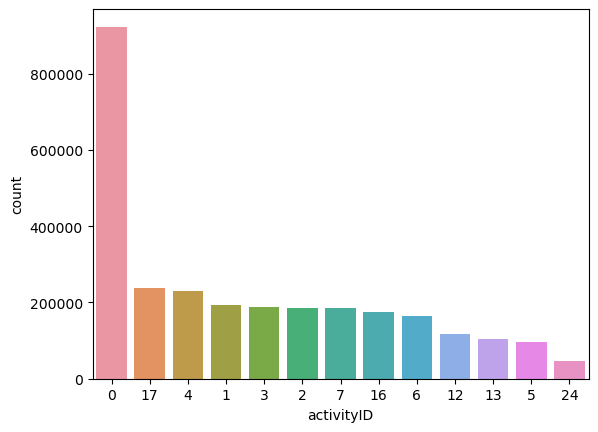

In [5]:
sns.countplot(x='activityID', data=df, order=df.activityID.value_counts().index)

In [25]:
def fit_label(female, male):
    id = [1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12, 13, 16, 17, 18, 19, 20, 24, 0]
    fv = female.activityID.value_counts()
    mv = male.activityID.value_counts()
    for i in id:
        if ((i in fv.index) and (i in mv.index)):
            if (fv.loc[i] > mv.loc[i]): # i번째 feature에서 여자꺼가 더 많다면
                print(f"{i}-- female - male = {fv.loc[i] - mv.loc[i]} ===== female의 {i}번째 shape: {female[female['activityID'] == i].shape}")
                female[female['activityID'] == i] = female[female['activityID'] == i].drop(pd.DataFrame(female[female['activityID'] == i].index).tail(fv.loc[i] - mv.loc[i]).iloc[:, 0].values.tolist())
                print(f"{i}-- 완료(female 데이터 일부 제거) ===== male의 {i}번째 shape: {male[male['activityID'] == i].shape}, female의 {i}번째 shape: {female[female['activityID'] == i].shape}")
            else:
                print(f"{i}-- male - female = {mv.loc[i] - fv.loc[i]} ===== male의 {i}번째 shape: {male[male['activityID'] == i].shape}")
                male[male['activityID'] == i] = male[male['activityID'] == i].drop(pd.DataFrame(male[male['activityID'] == i].index).tail(mv.loc[i] - fv.loc[i]).iloc[:, 0].values.tolist())
                print(f"{i}-- 완료(male 데이터 일부 제거) ===== male의 {i}번째 shape: {male[male['activityID'] == i].shape}, female의 {i}번째 shape: {female[female['activityID'] == i].shape}")
        elif ((i in fv.index) and (i not in mv.index)):
            print(f"{i} 요소 제거")
            female[female['activityID'] == i] = female[female['activityID'] == i].drop(pd.DataFrame(female[female['activityID'] == i].index).iloc[:, 0].values.tolist())
        elif ((i not in fv.index) and (i in mv.index)):
            print(f"{i} 요소 제거")
            male[male['activityID'] == i] = male[male['activityID'] == i].drop(pd.DataFrame(male[male['activityID'] == i].index).iloc[:, 0].values.tolist())

    return female, male

/var/folders/hf/lrx32m9n0n7f1twmsv3x62gw0000gn/T/ipykernel_74974/3177523643.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  female[female['activityID'] == 0] = female[female['activityID'] == 0].drop(pd.DataFrame(female[female['activityID'] == 0].index).iloc[:, 0].values.tolist())


1-- female - male = 243 ===== female의 1번째 shape: (23272, 55)
1-- 완료(female 데이터 일부 제거) ===== male의 1번째 shape: (23029, 55), female의 1번째 shape: (23029, 55)
2-- male - female = 3156 ===== male의 2번째 shape: (25478, 55)
2-- 완료(male 데이터 일부 제거) ===== male의 2번째 shape: (22322, 55), female의 2번째 shape: (22322, 55)
3-- female - male = 765 ===== female의 3번째 shape: (25416, 55)


/var/folders/hf/lrx32m9n0n7f1twmsv3x62gw0000gn/T/ipykernel_74974/3009957839.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  female[female['activityID'] == i] = female[female['activityID'] == i].drop(pd.DataFrame(female[female['activityID'] == i].index).tail(fv.loc[i] - mv.loc[i]).iloc[:, 0].values.tolist())
/var/folders/hf/lrx32m9n0n7f1twmsv3x62gw0000gn/T/ipykernel_74974/3009957839.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  female[female['activityID'] == i] = female[female['activityID'] == i].drop(pd.DataFrame(female[female['activityID'] == i].index)

3-- 완료(female 데이터 일부 제거) ===== male의 3번째 shape: (24651, 55), female의 3번째 shape: (24651, 55)
4-- female - male = 1470 ===== female의 4번째 shape: (31500, 55)
4-- 완료(female 데이터 일부 제거) ===== male의 4번째 shape: (30030, 55), female의 4번째 shape: (30030, 55)
5-- female - male = 8774 ===== female의 5번째 shape: (8775, 55)
5-- 완료(female 데이터 일부 제거) ===== male의 5번째 shape: (1, 55), female의 5번째 shape: (1, 55)
6-- female - male = 1986 ===== female의 6번째 shape: (24595, 55)
6-- 완료(female 데이터 일부 제거) ===== male의 6번째 shape: (22609, 55), female의 6번째 shape: (22609, 55)
7-- female - male = 1761 ===== female의 7번째 shape: (28451, 55)
7-- 완료(female 데이터 일부 제거) ===== male의 7번째 shape: (26690, 55), female의 7번째 shape: (26690, 55)
12-- female - male = 651 ===== female의 12번째 shape: (17334, 55)
12-- 완료(female 데이터 일부 제거) ===== male의 12번째 shape: (16683, 55), female의 12번째 shape: (16683, 55)
13-- female - male = 911 ===== female의 13번째 shape: (15190, 55)
13-- 완료(female 데이터 일부 제거) ===== male의 13번째 shape: (14279, 55), female의 13번째 shap

/var/folders/hf/lrx32m9n0n7f1twmsv3x62gw0000gn/T/ipykernel_74974/3009957839.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  female[female['activityID'] == i] = female[female['activityID'] == i].drop(pd.DataFrame(female[female['activityID'] == i].index).tail(fv.loc[i] - mv.loc[i]).iloc[:, 0].values.tolist())
/var/folders/hf/lrx32m9n0n7f1twmsv3x62gw0000gn/T/ipykernel_74974/3009957839.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  female[female['activityID'] == i] = female[female['activityID'] == i].drop(pd.DataFrame(female[female['activityID'] == i].index)

<Axes: xlabel='activityID', ylabel='count'>

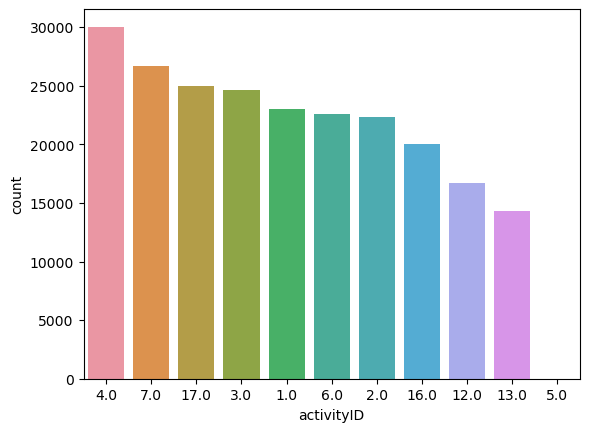

In [29]:
female = df[df['subject_id'] == 2]
male = df[df['subject_id'] == 4]

female[female['activityID'] == 0] = female[female['activityID'] == 0].drop(pd.DataFrame(female[female['activityID'] == 0].index).iloc[:, 0].values.tolist())

fv = female.activityID.value_counts()
mv = male.activityID.value_counts()
fv = fv.sort_index()
mv = mv.sort_index()

female, male = fit_label(female, male)
sns.countplot(x='activityID', data=female, order=female.activityID.value_counts().index)

<Axes: xlabel='activityID', ylabel='count'>

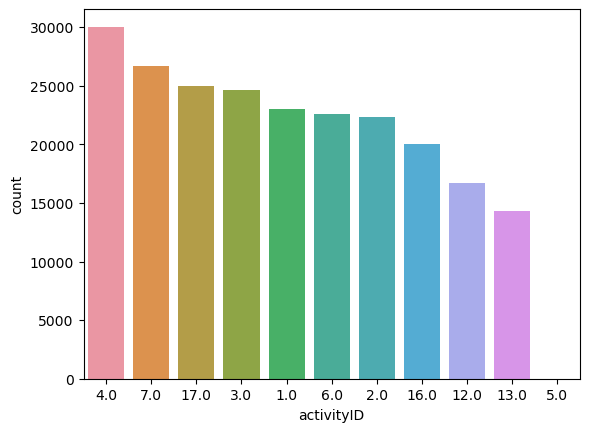

In [28]:
sns.countplot(x='activityID', data=male, order=male.activityID.value_counts().index)

In [39]:
female = female.dropna()
male = male.dropna()

female.shape, male.shape

((225229, 55), (225229, 55))

In [40]:
from sklearn.preprocessing import StandardScaler

X = np.concatenate([np.array(female[col]), np.array(male[col])])
y = np.concatenate([np.array(female['activityID']), np.array(male['activityID'])])
scaler = StandardScaler()
X = scaler.fit_transform(X)

scaled_X = pd.DataFrame(data = X, columns = col)
scaled_X['label'] = pd.Series(y).values

X.shape, y.shape

((450458, 36), (450458,))

In [41]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(scaled_X,
                                                    scaled_X['label'],
                                                    test_size=0.25,
                                                    shuffle=True,
                                                    random_state=42)

In [42]:
unique, counts = np.unique(y_train, return_counts=True)
print("Train data label statistics::")
print(np.asarray((unique, counts)).T)

unique, counts = np.unique(y_test, return_counts=True)
print("Test data label statistics::")
print(np.asarray((unique, counts)).T)

Train data label statistics::
[[1.0000e+00 3.4548e+04]
 [2.0000e+00 3.3525e+04]
 [3.0000e+00 3.7011e+04]
 [4.0000e+00 4.4986e+04]
 [5.0000e+00 1.0000e+00]
 [6.0000e+00 3.3929e+04]
 [7.0000e+00 3.9866e+04]
 [1.2000e+01 2.4990e+04]
 [1.3000e+01 2.1517e+04]
 [1.6000e+01 3.0123e+04]
 [1.7000e+01 3.7347e+04]]
Test data label statistics::
[[1.0000e+00 1.1510e+04]
 [2.0000e+00 1.1119e+04]
 [3.0000e+00 1.2291e+04]
 [4.0000e+00 1.5074e+04]
 [5.0000e+00 1.0000e+00]
 [6.0000e+00 1.1289e+04]
 [7.0000e+00 1.3514e+04]
 [1.2000e+01 8.3760e+03]
 [1.3000e+01 7.0410e+03]
 [1.6000e+01 9.8630e+03]
 [1.7000e+01 1.2537e+04]]


In [43]:
from scipy import stats

def create_dataset(X, y, time_steps=1, step=1):
    Xs, ys = [], []
    for i in range(0, len(X) - time_steps, step):
        v = X.iloc[i:(i + time_steps)].values
        labels = y.iloc[i: i + time_steps]
        Xs.append(v)        
        ys.append(stats.mode(labels)[0][0])
    return np.array(Xs), np.array(ys).reshape(-1, 1)

TIME_STEPS = 1
STEP = 1

X_train, y_train = create_dataset(X_train[col], X_train.label, TIME_STEPS, STEP)
X_test, y_test = create_dataset(X_test[col], X_test.label, TIME_STEPS, STEP)

print(X_train.shape, y_train.shape)

(337842, 1, 36) (337842, 1)


In [44]:
from sklearn.preprocessing import OneHotEncoder

enc = OneHotEncoder(handle_unknown='ignore', sparse=False)
enc = enc.fit(y_train)

y_train = enc.transform(y_train)
y_test = enc.transform(y_test)

/Users/kimtaeyoon/opt/anaconda3/lib/python3.9/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [76]:
pd.DataFrame(y_train)

,0,1,2,3,4,5,6,7,8,9,10
0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
337837,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
337838,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
337839,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
337840,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [151]:
from keras import backend as K

def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

In [45]:
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Bidirectional

In [152]:
model = Sequential([
    Bidirectional(LSTM(128, input_shape=[X_train.shape[1], X_train.shape[2]])),
    Dropout(0.5),
    Dense(128, activation='relu'),
    Dense(y_train.shape[1], activation='softmax')
])

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy', f1_m, precision_m, recall_m])

In [48]:
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_split=0.33)

Epoch 1/20
7074/7074 [==============================] - 21s 3ms/step - loss: 0.1865 - accuracy: 0.9385 - val_loss: 0.0923 - val_accuracy: 0.9697
Epoch 2/20
7074/7074 [==============================] - 32s 4ms/step - loss: 0.1129 - accuracy: 0.9627 - val_loss: 0.0591 - val_accuracy: 0.9811
Epoch 3/20
7074/7074 [==============================] - 27s 4ms/step - loss: 0.0876 - accuracy: 0.9705 - val_loss: 0.0427 - val_accuracy: 0.9862
Epoch 4/20
7074/7074 [==============================] - 22s 3ms/step - loss: 0.0729 - accuracy: 0.9756 - val_loss: 0.0348 - val_accuracy: 0.9891
Epoch 5/20
7074/7074 [==============================] - 24s 3ms/step - loss: 0.0630 - accuracy: 0.9787 - val_loss: 0.0311 - val_accuracy: 0.9899
Epoch 6/20
7074/7074 [==============================] - 21s 3ms/step - loss: 0.0591 - accuracy: 0.9800 - val_loss: 0.0299 - val_accuracy: 0.9900
Epoch 7/20
7074/7074 [==============================] - 21s 3ms/step - loss: 0.0537 - accuracy: 0.9823 - val_loss: 0.0243 - val_ac

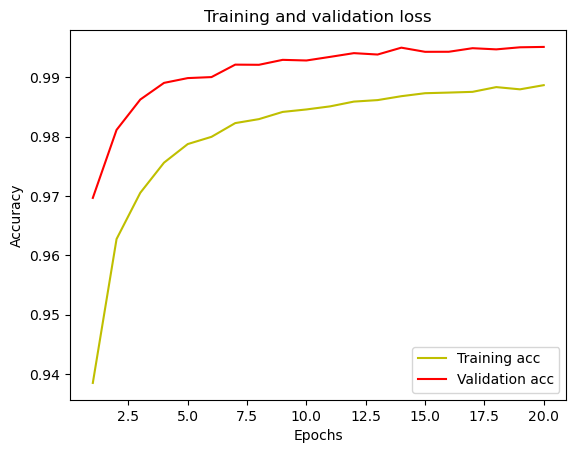

In [52]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc, 'y', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title("Training and validation loss")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [94]:
fem = female.activityID.value_counts().index.tolist()
1 in fem

in_fem = df['activityID'] in fem
in_fem

ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

In [130]:
X_ub = df[col]
y_ub = df['activityID']
scaler_ub = StandardScaler()
X_ub = scaler_ub.fit_transform(X_ub)

scaled_X_ub = pd.DataFrame(data = X_ub, columns = col)
scaled_X_ub['label'] = y_ub.values

scaled_X_ub.head(10)

,handAcc16_1,handAcc16_2,handAcc16_3,handAcc6_1,handAcc6_2,handAcc6_3,handGyro1,handGyro2,handGyro3,handMagne1,...,ankleAcc6_1,ankleAcc6_2,ankleAcc6_3,ankleGyro1,ankleGyro2,ankleGyro3,ankleMagne1,ankleMagne2,ankleMagne3,label
0,1.224895,0.799466,0.087944,1.222699,0.856035,0.000235,-0.068503,0.028096,-0.006246,-0.269436,...,0.025797,-0.240078,0.739314,0.001341,0.070493,-0.011664,-1.507237,-1.875621,-3.689774,0
1,1.194172,0.793859,0.127324,1.215255,0.821161,0.075099,-0.016169,0.017868,0.009152,-0.260341,...,0.020130,-0.249625,0.729901,-0.012571,0.047067,-0.001840,-1.436290,-1.872474,-3.708535,0
2,1.225119,0.799518,0.097964,1.200268,0.818784,0.098732,-0.042074,0.000714,-0.000136,-0.287695,...,0.022951,-0.244854,0.729845,-0.003602,0.055140,0.010271,-1.483284,-1.896626,-3.702368,0
3,1.175183,0.787945,0.126912,1.205298,0.818747,0.098724,0.000859,0.000980,0.002100,-0.260686,...,0.022996,-0.251998,0.748941,-0.003452,0.020646,0.004130,-1.465983,-1.866532,-3.702157,0
4,1.201022,0.836238,0.137268,1.187819,0.828869,0.106585,0.012144,-0.015408,-0.032104,-0.232779,...,0.025816,-0.254382,0.748931,0.005454,0.030764,-0.003586,-1.524755,-1.895427,-3.695951,0
5,1.212757,0.835930,0.097475,1.192954,0.838828,0.110474,0.005174,-0.022237,-0.032897,-0.237137,...,0.025793,-0.249618,0.739375,-0.012115,0.027861,-0.001467,-1.459967,-1.871821,-3.702260,0
6,1.219072,0.835883,0.097623,1.195576,0.858786,0.098602,-0.015622,-0.071697,-0.028349,-0.251120,...,0.031456,-0.249610,0.748850,-0.036321,-0.036086,0.006494,-1.477708,-1.871349,-3.696034,0
7,1.224760,0.871941,0.057491,1.215742,0.878612,0.074901,0.017393,-0.060948,-0.018528,-0.260640,...,0.028601,-0.249620,0.734588,-0.024791,-0.012476,-0.002471,-1.471697,-1.876639,-3.696142,0
8,1.219428,0.884307,0.097365,1.223395,0.893543,0.070903,0.021847,-0.096028,-0.003026,-0.273753,...,0.031473,-0.235298,0.753521,0.006435,0.037951,0.007647,-1.512676,-1.906085,-3.690074,0
9,1.206085,0.878187,0.067038,1.220901,0.898555,0.066957,0.008561,-0.101344,-0.008475,-0.260149,...,0.025817,-0.247226,0.748885,0.000733,0.031404,0.005894,-1.489358,-1.881276,-3.689971,0


In [131]:
X_train_ub, X_test_ub, y_train_ub, y_test_ub = train_test_split(scaled_X_ub,
                                                                scaled_X_ub['label'],
                                                                test_size=0.25,
                                                                shuffle=True,
                                                                random_state=42)

In [132]:
X_train_ub, y_train_ub = create_dataset(X_train_ub[col], X_train_ub.label, TIME_STEPS, STEP)
X_test_ub, y_test_ub = create_dataset(X_test_ub[col], X_test_ub.label, TIME_STEPS, STEP)

X_train_ub.shape, y_train_ub.shape

((2133650, 1, 36), (2133650, 1))

In [124]:
arr = np.array([[1, 2, 3], [4, 5, 6], [7, 8, 9]])

arr1 = np.delete(arr, [0, 1], axis=0)

arr1

array([[7, 8, 9]])

In [133]:
remove = []

for i in range(len(y_test_ub)):
    if y_test_ub[i][0] not in fem:
        print(f"index {i} not in fem: y_test_ub[{i}][0] == {y_test_ub[i][0]}")
        remove.append(i)

y_test_ub_hi = np.delete(y_test_ub, remove, axis=0)

y_test_ub_hi

index 0 not in fem: y_test_ub[0][0] == 0
index 1 not in fem: y_test_ub[1][0] == 0
index 4 not in fem: y_test_ub[4][0] == 0
index 5 not in fem: y_test_ub[5][0] == 0
index 6 not in fem: y_test_ub[6][0] == 0
index 7 not in fem: y_test_ub[7][0] == 0
index 10 not in fem: y_test_ub[10][0] == 0
index 15 not in fem: y_test_ub[15][0] == 0
index 19 not in fem: y_test_ub[19][0] == 0
index 22 not in fem: y_test_ub[22][0] == 0
index 23 not in fem: y_test_ub[23][0] == 0
index 24 not in fem: y_test_ub[24][0] == 0
index 32 not in fem: y_test_ub[32][0] == 0
index 33 not in fem: y_test_ub[33][0] == 0
index 34 not in fem: y_test_ub[34][0] == 0
index 37 not in fem: y_test_ub[37][0] == 0
index 38 not in fem: y_test_ub[38][0] == 0
index 39 not in fem: y_test_ub[39][0] == 0
index 42 not in fem: y_test_ub[42][0] == 0
index 43 not in fem: y_test_ub[43][0] == 0
index 44 not in fem: y_test_ub[44][0] == 0
index 47 not in fem: y_test_ub[47][0] == 0
index 48 not in fem: y_test_ub[48][0] == 0
index 50 not in fem: y_

array([[ 2],
       [ 5],
       [13],
       ...,
       [16],
       [16],
       [ 1]])

In [134]:
X_test_ub_hi = np.delete(X_test_ub, remove, axis=0)

y_test_ub_hi

array([[ 2],
       [ 5],
       [13],
       ...,
       [16],
       [16],
       [ 1]])

In [135]:
X_test_ub_hi.shape, y_test_ub_hi.shape, X_test_ub.shape, y_test_ub.shape

((467835, 1, 36), (467835, 1), (711216, 1, 36), (711216, 1))

In [140]:
enc_ub = OneHotEncoder(handle_unknown='ignore', sparse=False)
enc_ub = enc_ub.fit(y_train_ub)

y_test_ub_hi = enc.transform(y_test_ub_hi)

print(y_test_ub_hi.shape, y_test.shape)

(467835, 11) (112614, 11)


/Users/kimtaeyoon/opt/anaconda3/lib/python3.9/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [139]:
y_test.shape, y_test_ub_hi.shape

((112614, 11), (467835, 1))

In [73]:
pd.DataFrame(y_test).head(10)

,0,1,2,3,4,5,6,7,8,9,10
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
7,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [57]:
loss, accuracy, f1_score, precision, recall = model.evaluate(X_test, y_test, verbose=1)

3520/3520 [==============================] - 5s 1ms/step - loss: 0.0141 - accuracy: 0.9953


[0.014130969531834126, 0.9953025579452515]

In [ ]:
f1_score

In [142]:
model.evaluate(X_test_ub_hi, y_test_ub_hi)

14620/14620 [==============================] - 14s 960us/step - loss: 6.1898 - accuracy: 0.6900


[6.189801216125488, 0.6899847388267517]

In [143]:
from sklearn.metrics import confusion_matrix

y_test_arg_ub = np.argmax(y_test_ub_hi, axis=1)
y_pred_ub = np.argmax(model.predict(X_test_ub_hi), axis=1)
print('Confusion Matrix')
print(confusion_matrix(y_test_arg_ub, y_pred_ub))

14620/14620 [==============================] - 14s 902us/step
Confusion Matrix
[[39749  5635    11    50     0    26    41   607  1380   251    40]
 [ 1142 35097  1000   240     0     3   124   240  1757  5531   801]
 [ 1069 10540 17070  3723     0    99    14  3480  1029  5228  5071]
 [  268   679    68 38894     0    83  9822  3888  2514  1044   188]
 [  204    85    13  3542     5   419  7154  3451  7909  1096   166]
 [   40   131    73    71    19 35695   250   202   572  2932   829]
 [   64   369    80  2066    20   243 34986  1058  4450  1878   772]
 [   40   943    76   798     0   366   892 22124  1726  1922   363]
 [   46   789    29  1405     0   526   712  3234 17573  1469   472]
 [  130  1862   271   271     6  1510   360  1563  1687 34254  1756]
 [    4   303  1722   416    69  2443    21    56  4008  2926 47352]]


In [145]:
y_test_arg = np.argmax(y_test,axis=1)
y_pred = np.argmax(model.predict(X_test), axis=1)
print('Confusion Matrix')
print(confusion_matrix(y_test_arg, y_pred))

3520/3520 [==============================] - 3s 958us/step
Confusion Matrix
[[11510     0     0     0     0     0     0     0     0     0     0]
 [    0 11118     0     0     0     0     0     0     0     1     0]
 [    0     0 12234     0     0     0     0     0     0     1    55]
 [    0     0     0 14995     0     0    66     9     2     1     1]
 [    0     0     0     1     0     0     0     0     0     0     0]
 [    0     0     0     0     0 11277     0     0     1    11     0]
 [    0     0     0   100     0     0 13407     1     4     2     0]
 [    1     0     0    12     0     2     6  8319    27     9     0]
 [    1     0     0    25     0     5    10    36  6944    13     7]
 [    0     2     0     1     0     4     2     1     1  9850     2]
 [    0     0   105     0     0     0     0     0     0     1 12431]]
